In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# ! ln -s /content/drive/MyDrive/datasets/BreakHis_v1 /content/drive/MyDrive/src/BreakHis_Activation-Map-Generation-Noised-Latent-Factors/datasets

In [ ]:
! ln -s /content/drive/MyDrive/src/BreakHis_Activation-Map-Generation-Noised-Latent-Factors/ /content

In [ ]:
%cd BreakHis_Activation-Map-Generation-Noised-Latent-Factors/

/content/drive/MyDrive/src/BreakHis_Activation-Map-Generation-Noised-Latent-Factors


In [ ]:
! pip install tensorflow==2.15.1

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 36.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 32.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 59.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.4 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.0
    Uninstalling ml-dtypes-0.4.0:
      Successfully uninstalled ml-dtypes-0.4.0
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: tensorboard
    Found existing installation

# Initialization

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import glob
import pandas as pd
import matplotlib.pyplot as plt
import os

print(tf.__version__)

2.15.1


In [ ]:
import configs
from ActMapGen import *

In [ ]:
import importlib
importlib.reload(configs)
print(dir(configs))

['CGUNET_CHECKPOINT', 'CHECKPOINT_DIR', 'CLASSIFIER_CHECKPOINT', 'CLASS_NAMES', 'DATA_DIR', 'GENERATOR_CHECKPOINT', 'IMAGE_SIZE', 'NUM_CLASS', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__']


# Data Loader

In [ ]:
class MyDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data_dir, subsets_csv, subset,
                       batch_size=32, shuffle=True):
        self.data_dir = data_dir
        self.subsets_csv = subsets_csv
        self.subset = subset
        self.batch_size = batch_size
        self.shuffle = shuffle

        self.filenames = None
        self.load()
        self.indices = None
        self.on_epoch_end()

    def load(self):
        df = pd.read_csv(self.subsets_csv)
        self.filenames = df[df['grp'] == self.subset
                            ]['filename'].tolist()
        self.filenames = [os.path.join(self.data_dir, it)
                          for it in self.filenames]
        print(len(self.filenames), 'images found')
        print(self.filenames[0])

    def __len__(self):
        return int(np.ceil(len(self.filenames) / self.batch_size))

    def __getitem__(self, index):
        indices = self.indices[index*self.batch_size:(index+1)*self.batch_size]
        filenames = [self.filenames[k] for k in indices]
        X, Y = self.__data_generation(filenames)
        return X, Y

    def on_epoch_end(self):
        self.indices = np.arange(len(self.filenames))
        if self.shuffle == True:
            np.random.shuffle(self.indices)

    def filename2onehot(self, fn):
        for i, classname in enumerate(configs.CLASS_NAMES):
            if classname in fn:
                result = np.zeros(configs.NUM_CLASS, dtype=np.float64)
                result[i] = 1
                return result
        return None

    def __data_generation(self, filenames):
        num = len(filenames)
        X = np.empty([num, *configs.IMAGE_SIZE], dtype=np.float64)
        Y_class = np.empty([num, configs.NUM_CLASS])
        for i, fn in enumerate(filenames):
            img = cv2.imread(fn)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            delta = (configs.IMAGE_SIZE[1] - configs.IMAGE_SIZE[0]) // 2
            img = img[:, delta:configs.IMAGE_SIZE[1]-delta-1]
            img = cv2.resize(img, configs.IMAGE_SIZE[:2])
            X[i] = np.array(img, dtype=np.float64) / 255.
            Y_class[i] = self.filename2onehot(fn)

        return X, {'out_img':X, 'out_class':Y_class}

In [ ]:
train_datagen = MyDataGenerator(configs.DATA_DIR,
                                configs.DATA_DIR+'/subsets.csv',
                                'train', shuffle=False)
val_datagen = MyDataGenerator(configs.DATA_DIR,
                                configs.DATA_DIR+'/subsets.csv',
                                'val', shuffle=False)
test_datagen = MyDataGenerator(configs.DATA_DIR,
                                configs.DATA_DIR+'/subsets.csv',
                                'test', shuffle=False)

4000 images found
datasets/BreakHis_v1/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-12773/40X/SOB_M_MC-14-12773-40-021.png
1000 images found
datasets/BreakHis_v1/benign/SOB/fibroadenoma/SOB_B_F_14-14134/40X/SOB_B_F-14-14134-40-003.png
2909 images found
datasets/BreakHis_v1/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570C/100X/SOB_M_LC-14-15570C-100-005.png


In [ ]:
X, Ys = train_datagen[0]

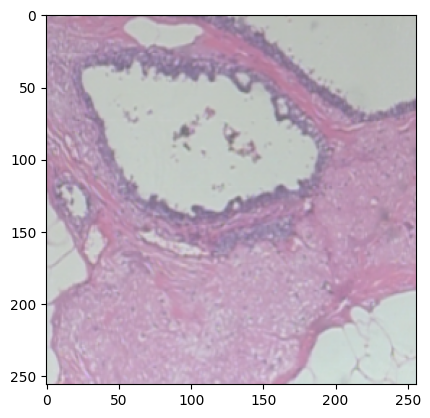

In [ ]:
img = X[0]
plt.imshow((img*255).astype(np.uint8))

# Activation Maps Plotting

In [ ]:
classifier = tf.keras.models.load_model(configs.CLASSIFIER_CHECKPOINT)
generator = tf.keras.models.load_model(configs.GENERATOR_CHECKPOINT)

In [ ]:
X, Ys = train_datagen[0]
Y = Ys['out_class']
print(X.shape, Y.shape)

index = 0
img = X[index]
label = Y[index].argmax()
print(img.shape, label)

(32, 256, 256, 3) (32, 8)
(256, 256, 3) 6


In [ ]:
act_map_my = MyActivationMapGen() \
                .generate_activation_map(img, label, classifier, generator)
act_map_px = PixelWiseActivationMapGen() \
                .generate_activation_map(img, label, classifier)
act_map_sppx = SuperPixelActivationMapGen() \
                .generate_activation_map(img, label, classifier, num_segments=128)

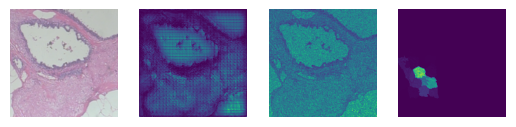

In [ ]:
for i, imap in enumerate([img, act_map_my, act_map_px, act_map_sppx]):
  plt.subplot(1, 4, i+1)
  plt.axis('off')
  plt.imshow(imap)
plt.show()

In [ ]:
def plots(X, Y, classifier, generator, num_segments=128):
  for index in range(X.shape[0]):
    img = X[index]
    label = Y[index].argmax()

    act_map_my = MyActivationMapGen() \
                .generate_activation_map(img, label, classifier, generator)
    act_map_px = PixelWiseActivationMapGen() \
                .generate_activation_map(img, label, classifier)
    act_map_sppx = SuperPixelActivationMapGen() \
                .generate_activation_map(img, label, classifier, num_segments)

    plt.subplot(1, 4, 1)
    plt.axis('off')
    plt.imshow((img * 255).astype(np.uint8))

    for i, imap in enumerate([act_map_my, act_map_px, act_map_sppx]):
      plt.subplot(1, 4, i+2)
      plt.axis('off')
      plt.imshow(imap)
    plt.tight_layout()
    plt.show()

## Training set

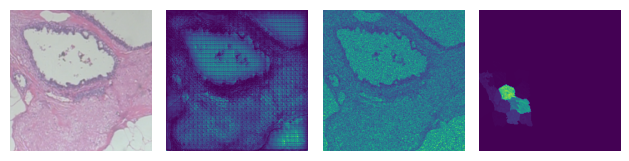

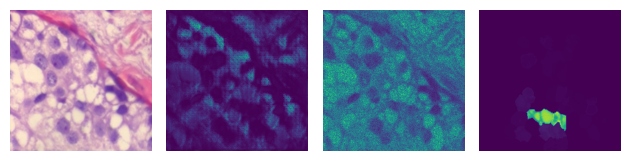

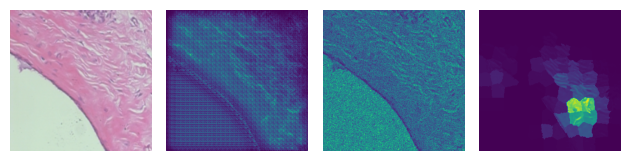

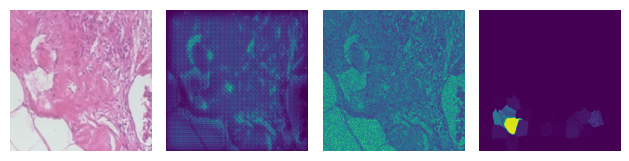

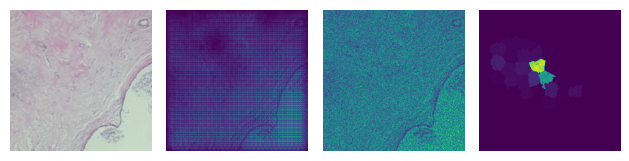

...

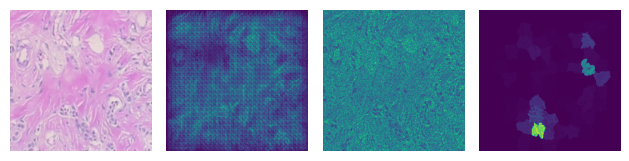

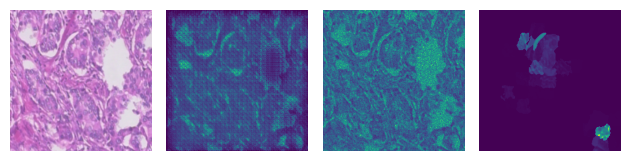

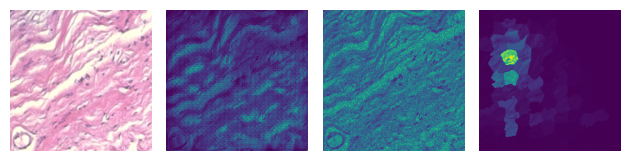

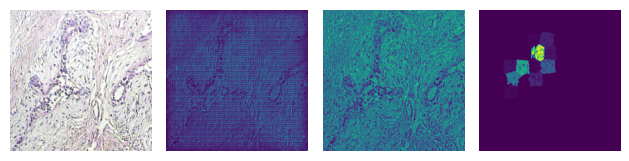

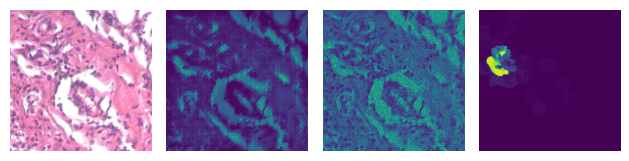

In [ ]:
plots(X, Y, classifier, generator)

## Validation set

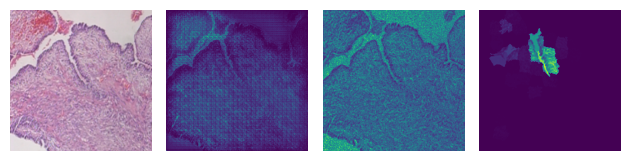

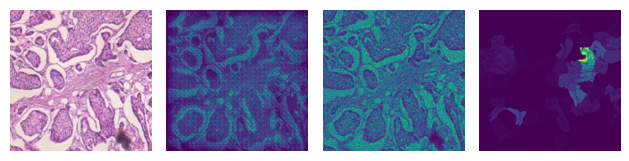

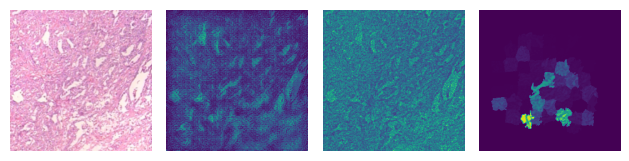

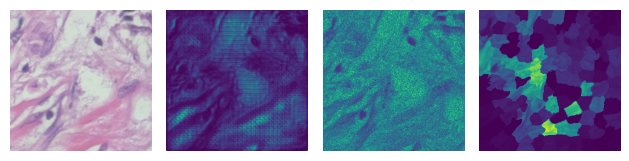

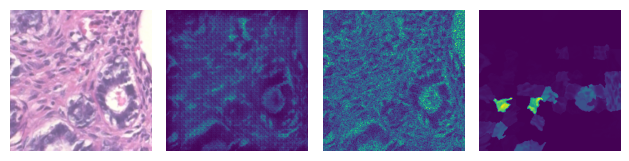

...

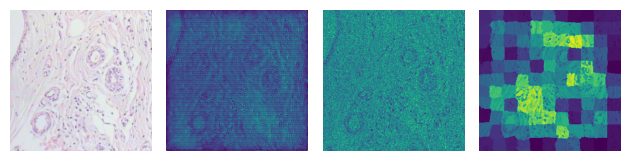

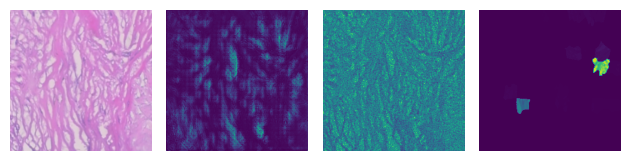

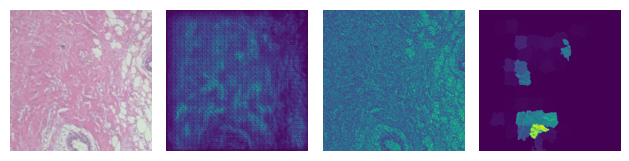

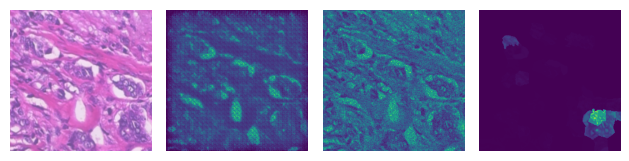

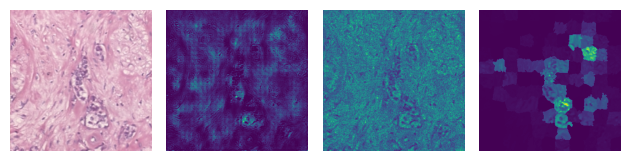

In [ ]:
X, Ys = val_datagen[1]
Y = Ys['out_class']
plots(X, Y, classifier, generator)

## Test set

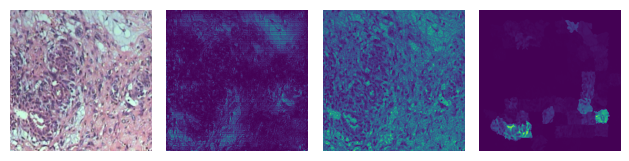

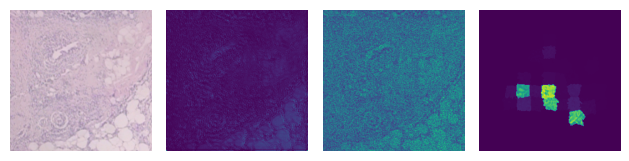

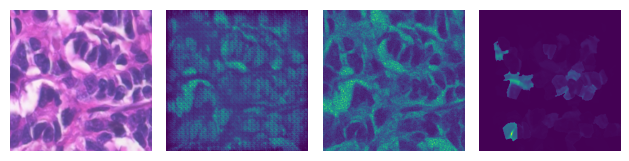

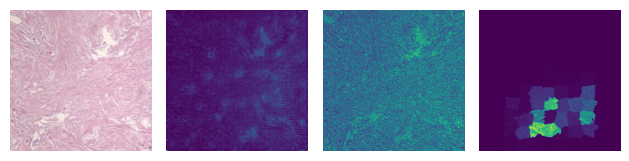

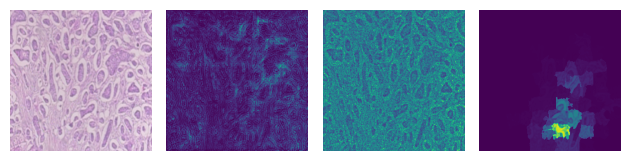

...

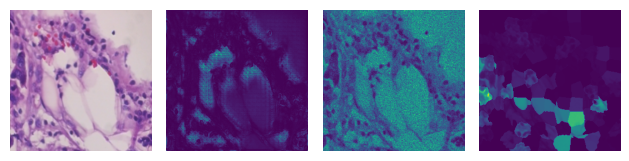

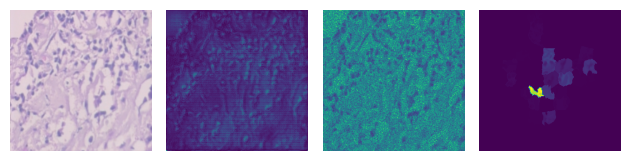

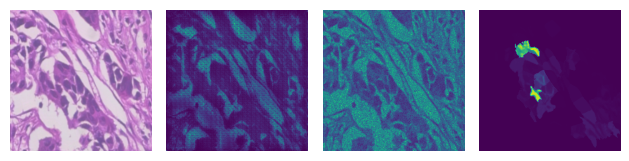

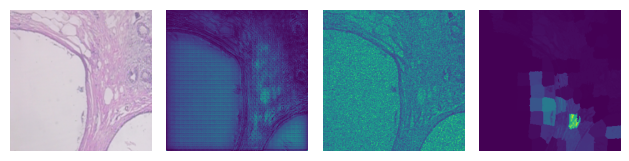

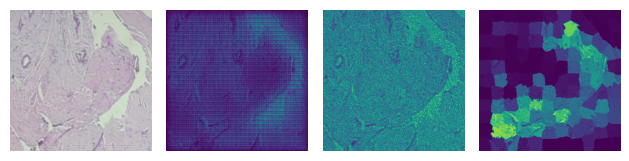

In [ ]:
X, Ys = test_datagen[1]
Y = Ys['out_class']
plots(X, Y, classifier, generator)

# AOPC-like metrics

In [ ]:
def compute_confidence_loss(img, label, classifier, activation_map, threshold=0.5):
  activation_map /= activation_map.max()
  mask = np.where(activation_map < threshold, 1, 0)
  mask = np.dstack([mask] * 3)
  img *= mask
  return classifier.predict(np.array([img]))[0][label]

In [ ]:
compute_confidence_loss(img.copy(), label, classifier, act_map_my, threshold=0.5)

1/1 [==============================] - 0s 231ms/step


0.16406374

In [ ]:
compute_confidence_loss(img.copy(), label, classifier, act_map_px, threshold=0.5)

1/1 [==============================] - 0s 231ms/step


0.10289819

In [ ]:
compute_confidence_loss(img.copy(), label, classifier, act_map_sppx, threshold=0.5)

1/1 [==============================] - 0s 230ms/step


0.27918875

In [ ]:
print(classifier.predict(np.array([img]))[0][label])

1/1 [==============================] - 0s 412ms/step
0.27970704


In [ ]:
_myActivationMapGen = MyActivationMapGen()
_pixelWiseActivationMapGen = PixelWiseActivationMapGen()
_superPixelActivationMapGen = SuperPixelActivationMapGen()

def run(img, label, classifier, threshold=0.5):
  act_map_my = _myActivationMapGen \
                .generate_activation_map(img, label, classifier, generator)

  act_map_px = _pixelWiseActivationMapGen \
                  .generate_activation_map(img, label, classifier)

  act_map_sppx = _superPixelActivationMapGen \
                  .generate_activation_map(img, label, classifier, num_segments=128)

  origin = classifier.predict(np.array([img]), verbose=0)[0][label]
  my = compute_confidence_loss(img.copy(), label, classifier, act_map_my, threshold=0.5)
  px = compute_confidence_loss(img.copy(), label, classifier, act_map_px, threshold=0.5)
  sppx = compute_confidence_loss(img.copy(), label, classifier, act_map_sppx, threshold=0.5)

  return origin, origin-my, origin-px, origin-sppx

In [ ]:
run(img, label, classifier)

In [ ]:
tf.keras.utils.disable_interactive_logging()

save_filename = 'confidence_diff/confidence_diff.csv'

count = 0
for X, Ys in test_datagen:
  for i in range(X.shape[0]):
    if count > 2863:
      img = X[i]
      label = Ys['out_class'][i].argmax()
      origin, my, px, sppx = run(img, label, classifier)
      open(save_filename, 'a') \
          .write('%s,%g,%g,%g,%g\n'%(count, origin, my, px, sppx))
      print(count, origin, my, px, sppx)
    count += 1

2864 0.27970752 0.17680818 0.17680773 0.011329412
2865 0.22479258 -0.034229442 0.108349144 0.12207143
2866 0.2797077 0.121891126 0.17680758 2.2470951e-05
2867 0.2796162 1.8298626e-05 0.17671525 0.1337737
2868 0.27970806 0.1686092 0.17680913 4.172325e-07
2869 0.2797063 5.632639e-06 0.17676166 0.0095844865
2870 0.2797036 0.15030584 0.17680411 0.05626306
2871 0.27970704 0.17680252 0.17454341 0.0038102865
2872 0.27970475 0.18443862 0.17680606 1.7881393e-05
2873 0.2797075 0.17680821 0.176483 0.0013707876
2874 0.27900994 0.18106677 0.1761108 0.13357918
2875 0.2797067 0.17287353 0.17680562 3.272295e-05
2876 0.279701 0.15388213 0.17679906 0.0112532675
2877 0.27966824 -3.6031008e-05 -3.9696693e-05 0.00027897954
2878 0.27795324 0.1754165 0.17504528 0.16369924
2879 0.2770707 0.0023167431 0.17495428 0.17118546
2880 0.27970803 0.000823617 0.17680487 0.004419178
2881 0.2794498 0.010150284 0.17633581 0.021038651
2882 0.2797081 0.0149562955 0.17671087 3.0398369e-06
2883 0.2735572 0.065333456 0.1665651